In [1]:
%%time
import numpy as np
import scanpy as sc
import os
import pandas as pd
import bbknn
import matplotlib.pyplot as plt
import seaborn as sns
sc.settings.verbosity = 4                
sc.settings.set_figure_params(80)                 
sc.settings.file_format_figures = 'pdf'  
sc.settings.savefigs = False            
use_first_n_samples = 0
full_sparse = False

Wall time: 16.8 s


In [2]:
from sklearn import preprocessing

# Bat scores

In [3]:
def DE_score(adata,de_gene_list,group_name):
    de_genes = [i for i in de_gene_list if i in adata.var_names]
    celltype_adata = adata.copy()
    sc.pp.normalize_per_cell(celltype_adata, counts_per_cell_after=1e4)
    sc.pp.log1p(celltype_adata)
    sc.pp.scale(celltype_adata)
    sc.tl.score_genes(celltype_adata,gene_list=de_genes, score_name= group_name+'_score')
    adata_cc_genes = celltype_adata[:, de_genes].copy()
    sc.tl.pca(adata_cc_genes)
    sc.pl.pca_scatter(adata_cc_genes, color=group_name+'_score')
    adata.obs[group_name+'_score'] = celltype_adata.obs[group_name+'_score'].copy()


adataa.h5ad

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 1_Bat_score'
    finished: added
    'Cluster 1_Bat_score', score of gene set (adata.obs).
    727 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


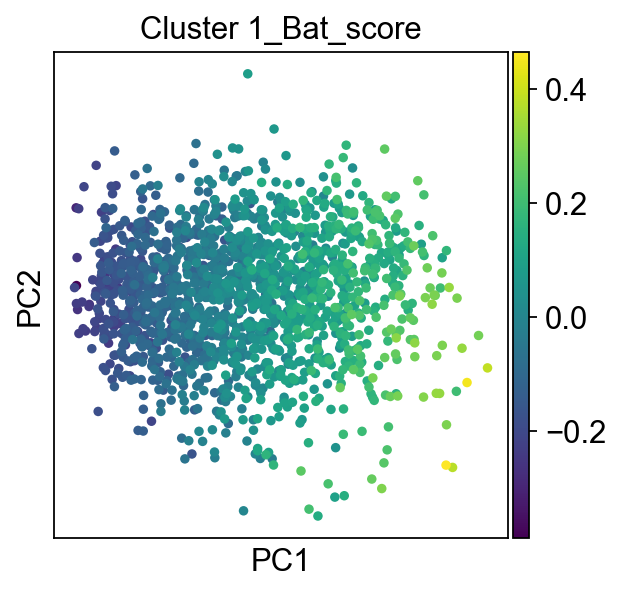

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 2_Bat_score'
    finished: added
    'Cluster 2_Bat_score', score of gene set (adata.obs).
    737 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


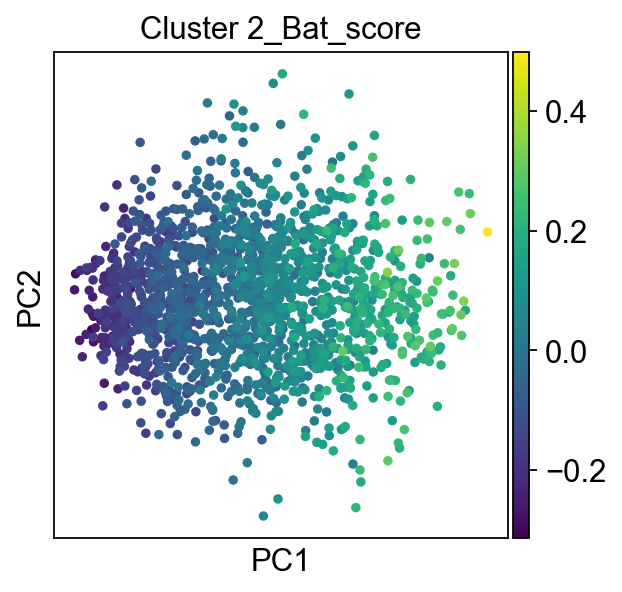

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 3_Bat_score'
    finished: added
    'Cluster 3_Bat_score', score of gene set (adata.obs).
    734 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


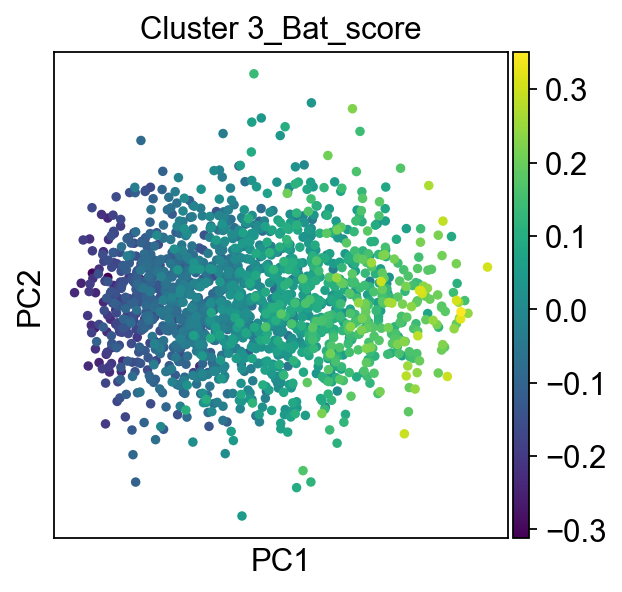

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 4_Bat_score'
    finished: added
    'Cluster 4_Bat_score', score of gene set (adata.obs).
    742 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


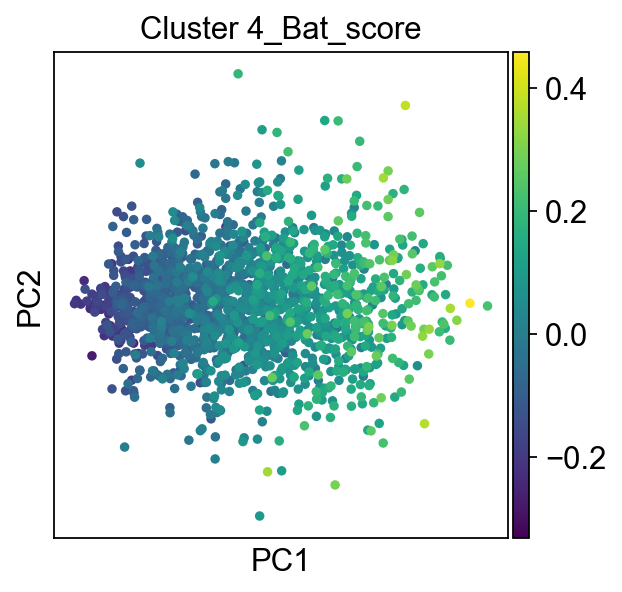

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 5_Bat_score'
    finished: added
    'Cluster 5_Bat_score', score of gene set (adata.obs).
    735 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


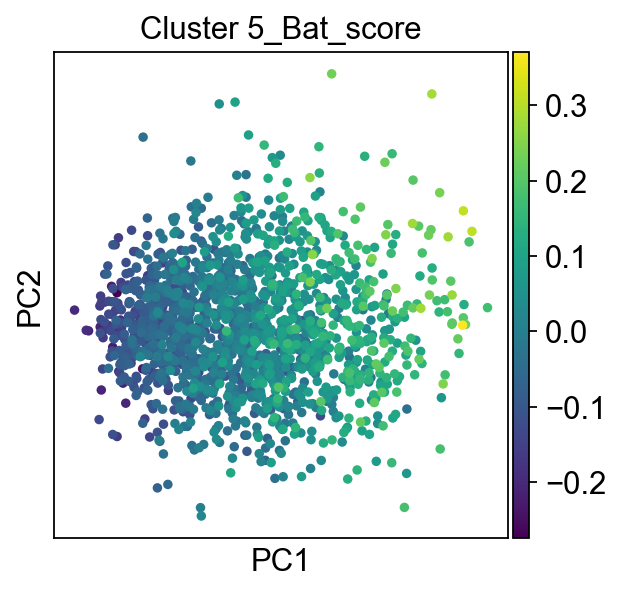


adatab.h5ad

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 1_Bat_score'
    finished: added
    'Cluster 1_Bat_score', score of gene set (adata.obs).
    689 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


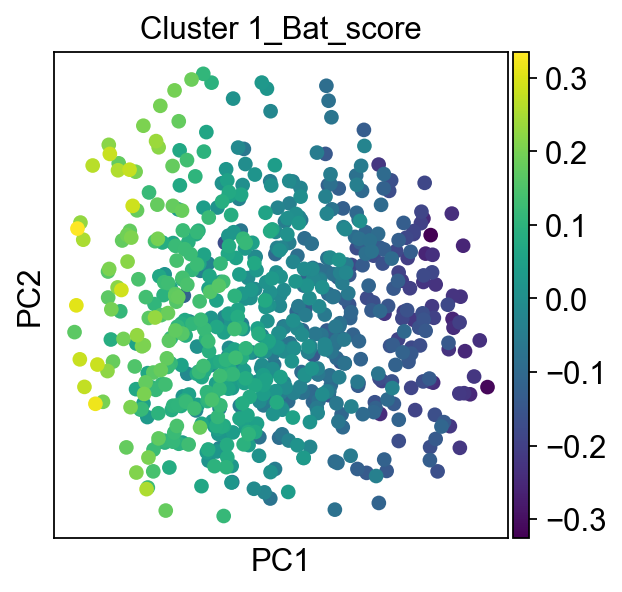

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 2_Bat_score'
    finished: added
    'Cluster 2_Bat_score', score of gene set (adata.obs).
    685 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


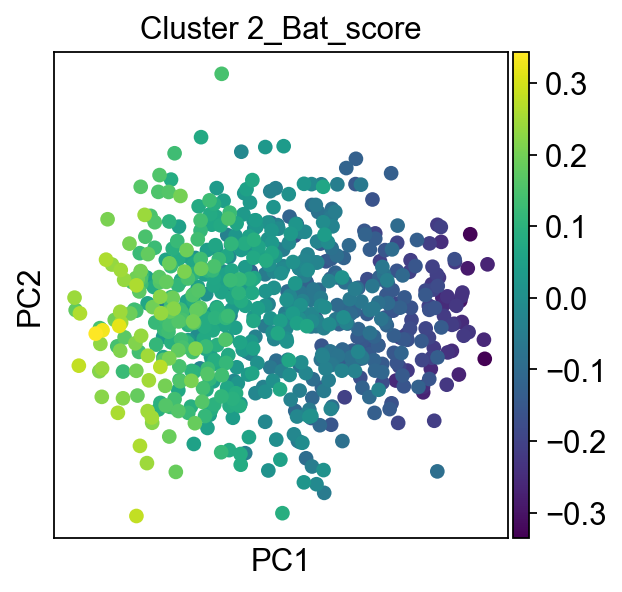

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 3_Bat_score'
    finished: added
    'Cluster 3_Bat_score', score of gene set (adata.obs).
    693 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


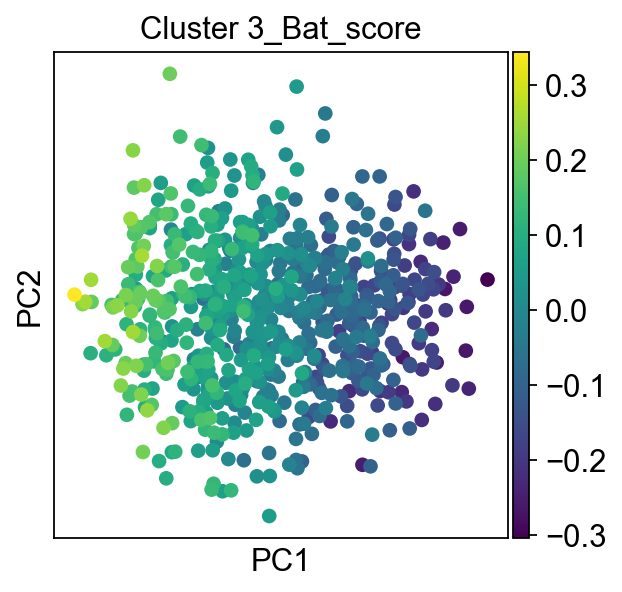

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 4_Bat_score'
    finished: added
    'Cluster 4_Bat_score', score of gene set (adata.obs).
    691 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


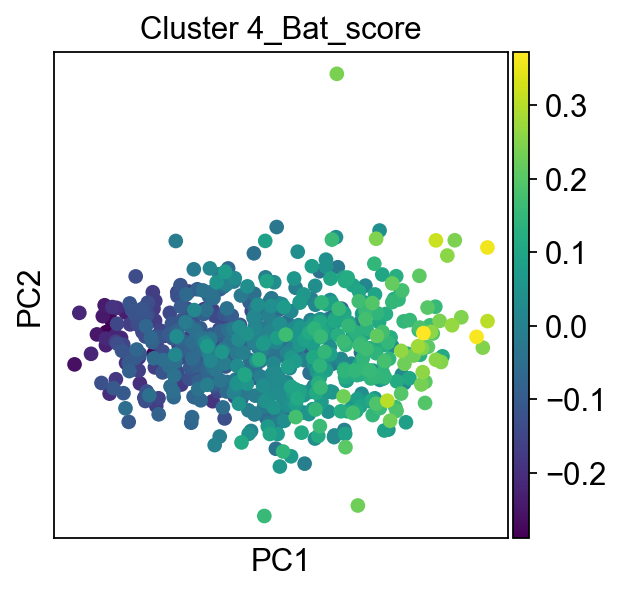

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 5_Bat_score'
    finished: added
    'Cluster 5_Bat_score', score of gene set (adata.obs).
    688 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


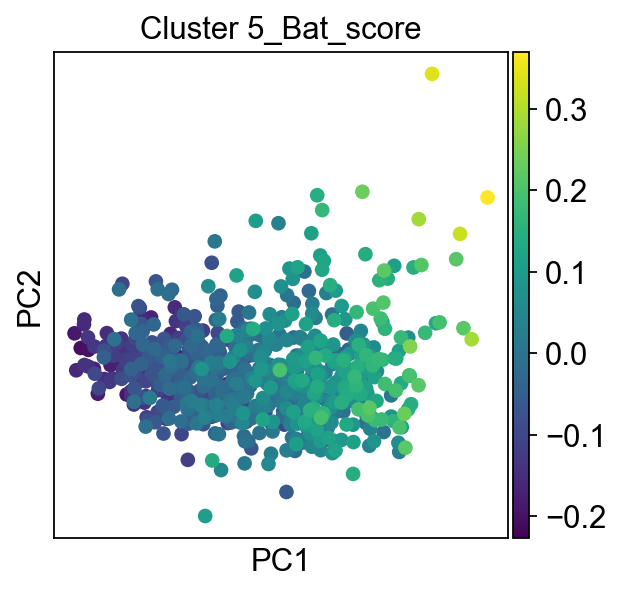


adatac.h5ad

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 1_Bat_score'
    finished: added
    'Cluster 1_Bat_score', score of gene set (adata.obs).
    732 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


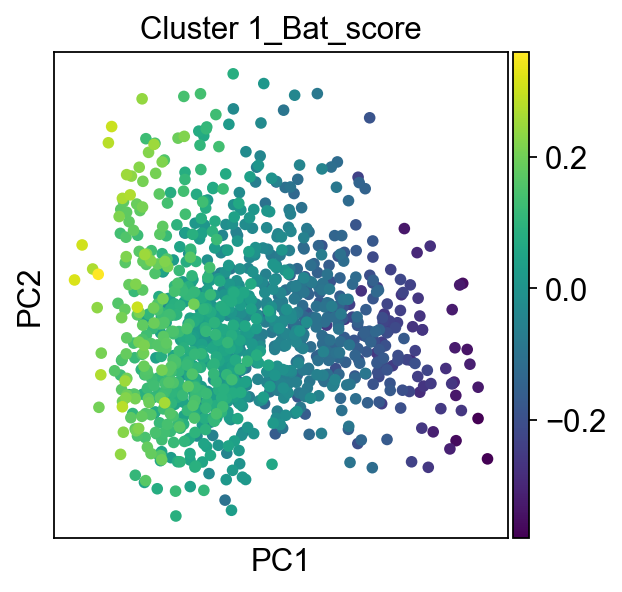

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 2_Bat_score'
    finished: added
    'Cluster 2_Bat_score', score of gene set (adata.obs).
    735 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


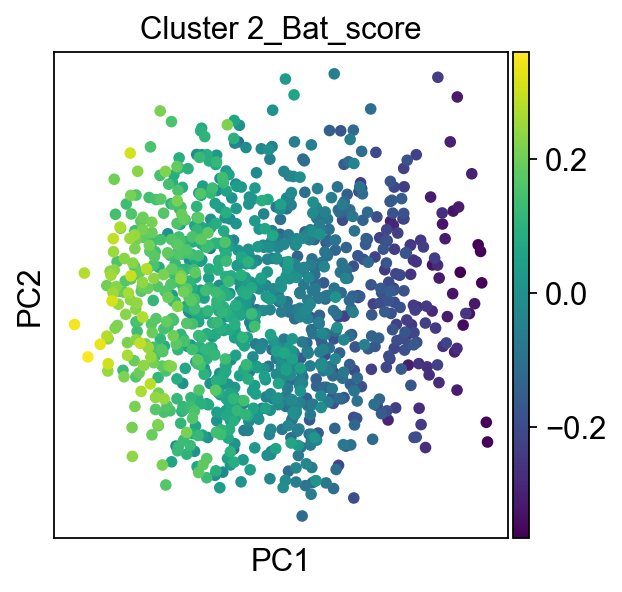

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 3_Bat_score'
    finished: added
    'Cluster 3_Bat_score', score of gene set (adata.obs).
    738 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


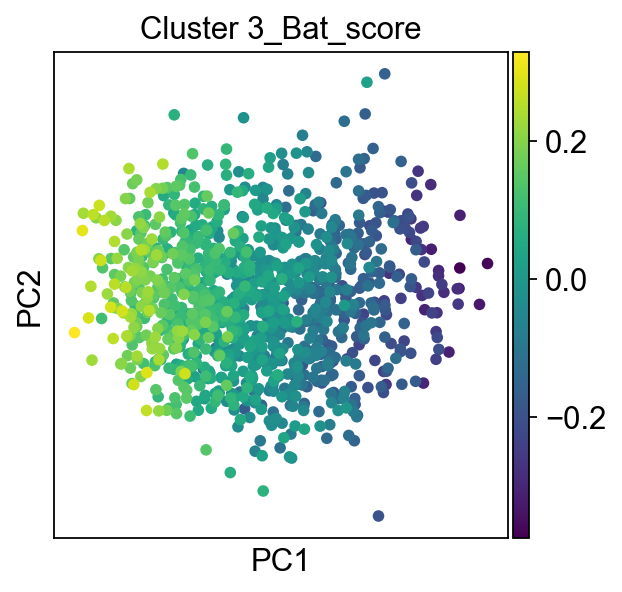

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 4_Bat_score'
    finished: added
    'Cluster 4_Bat_score', score of gene set (adata.obs).
    744 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


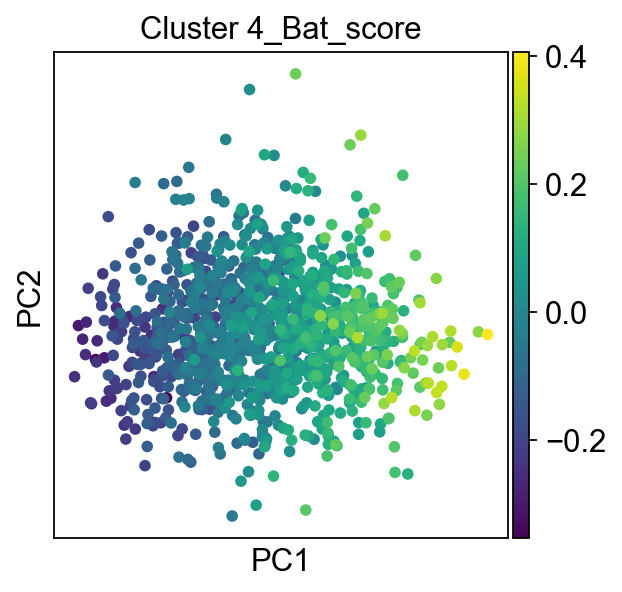

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 5_Bat_score'
    finished: added
    'Cluster 5_Bat_score', score of gene set (adata.obs).
    735 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


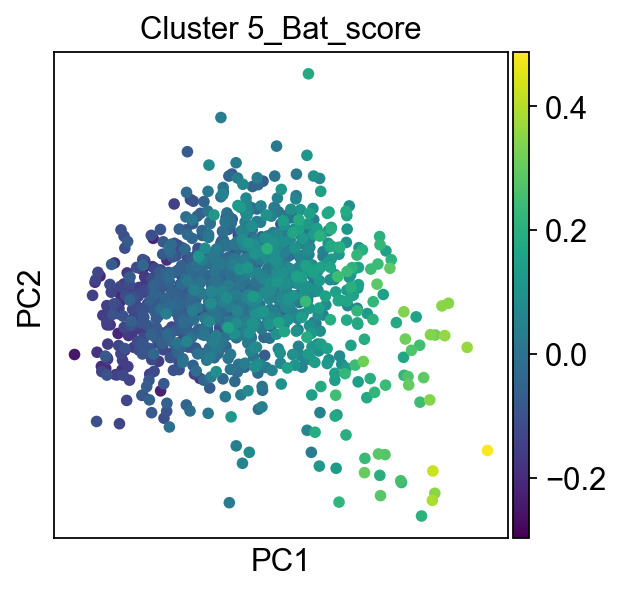


adatad.h5ad

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 1_Bat_score'
    finished: added
    'Cluster 1_Bat_score', score of gene set (adata.obs).
    826 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


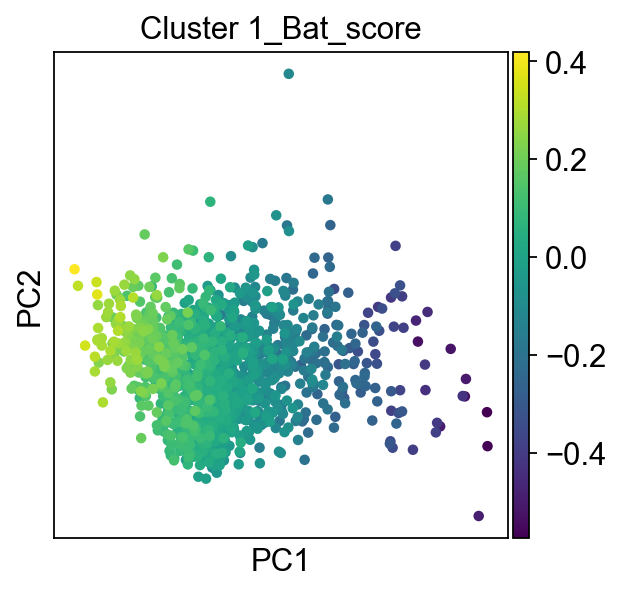

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 2_Bat_score'
    finished: added
    'Cluster 2_Bat_score', score of gene set (adata.obs).
    831 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


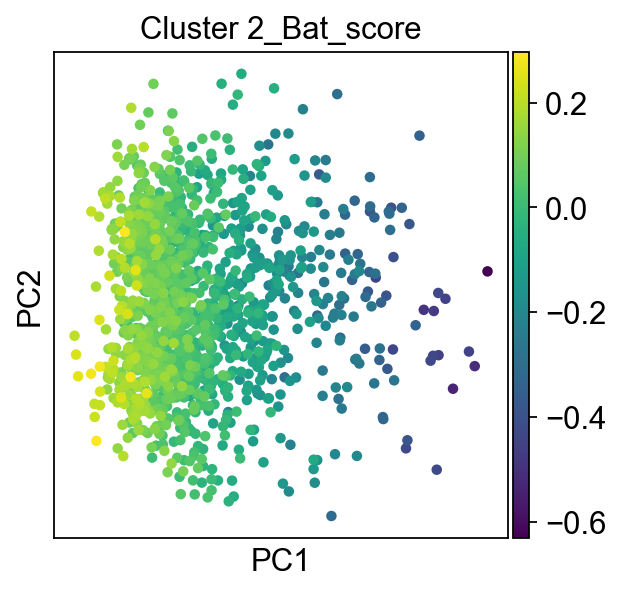

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 3_Bat_score'
    finished: added
    'Cluster 3_Bat_score', score of gene set (adata.obs).
    833 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


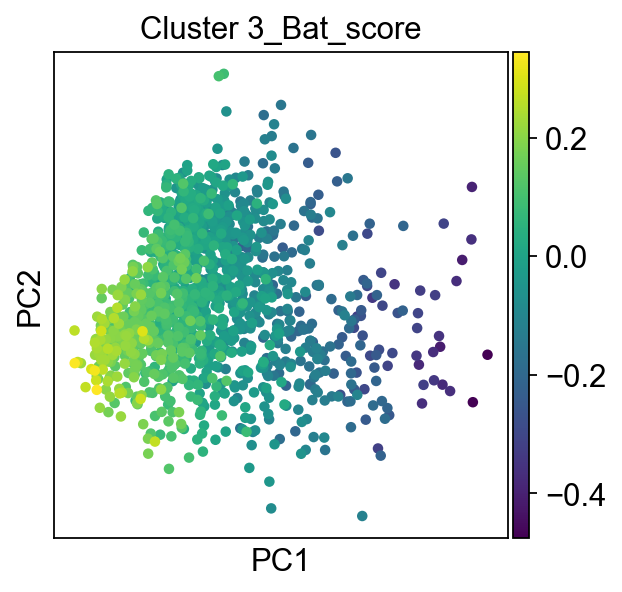

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 4_Bat_score'
    finished: added
    'Cluster 4_Bat_score', score of gene set (adata.obs).
    841 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


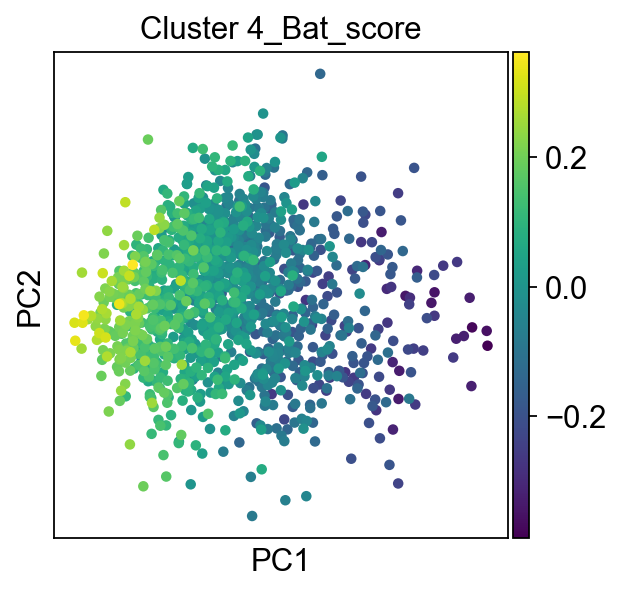

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 5_Bat_score'
    finished: added
    'Cluster 5_Bat_score', score of gene set (adata.obs).
    831 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


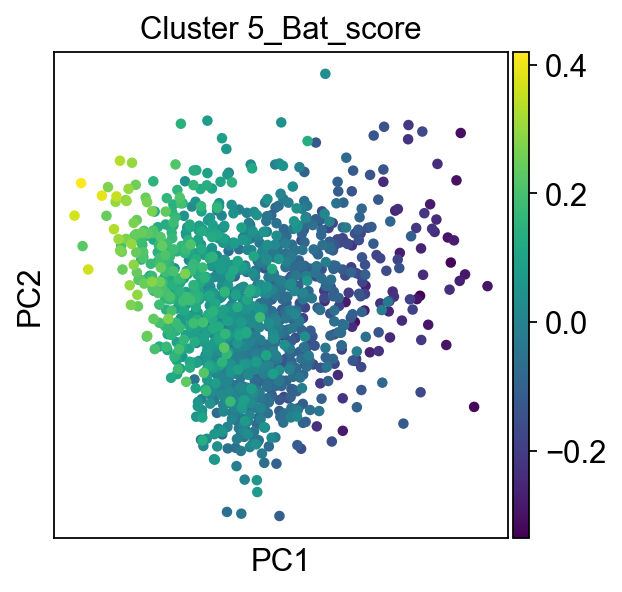

In [4]:
file_names  = ['adataa.h5ad','adatab.h5ad','adatac.h5ad','adatad.h5ad'] 

mainpath = r'C:\\Users\\TzachiHNB5\\Documents\\Project_barrier_immune\\scanpy\\scanpy_bat1k\\spatial\\raw_afterqc_and_filtration\\'
adatas = []
bat_score = pd.read_csv("zonation_score_genes.csv",index_col=0)
columns_to_select = [col for col in bat_score.columns if col.endswith('_Bat')]
bat_score = bat_score[columns_to_select]
bat_score.fillna('null',inplace=True)
cluster_dict = {}
for group in bat_score.columns:
    cluster_dict[group] = [i for i in bat_score[group].values if i!='null']
    
for file in file_names:
    adata=sc.read(mainpath+file)  
    adata.var.index=adata.var.index.str.upper()
    print('\n'+file +'\n')
    for group in cluster_dict:
        DE_score(adata,cluster_dict[group],group)          
    adatas.append(adata)

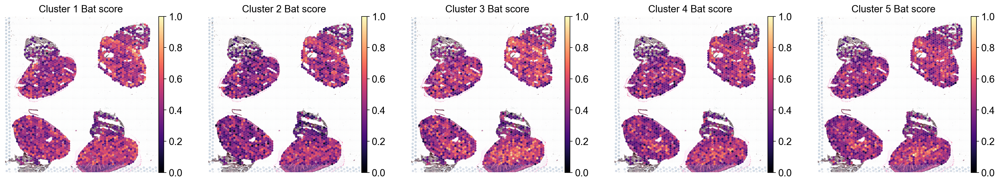

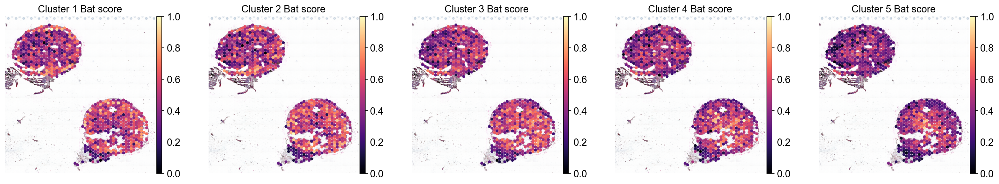

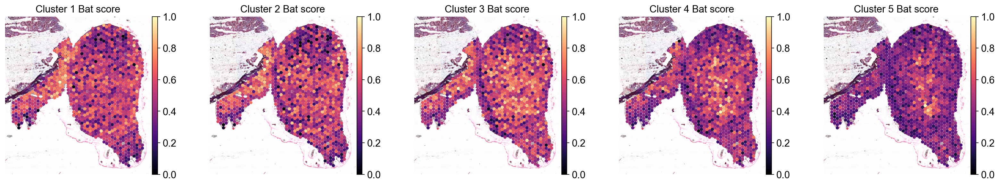

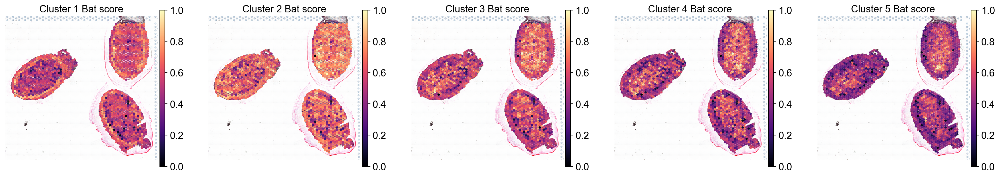

In [5]:
names = ['adataa','adatab','adatac','adatad']
scores = ['Cluster 1_Bat_score','Cluster 2_Bat_score','Cluster 3_Bat_score','Cluster 4_Bat_score','Cluster 5_Bat_score']
import matplotlib.pyplot as plt
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

for i in range(0,len(adatas)):
    for col in scores:
        x = adatas[i].obs[col].copy()
        adatas[i].obs[col] = (x-np.min(x))/(np.max(x)-np.min(x))

for data,name in zip(adatas,names):
    sc.pl.spatial(data, img_key="hires",ncols=5, color=scores, size=1.5,color_map = 'magma',frameon=False,title = [i.replace('_',' ') for i in scores],save = '_'+name+'_villi_scores.pdf')
   

# Mouse scores


slide1_small\spm.h5ad

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 1_Mouse_score'
    finished: added
    'Cluster 1_Mouse_score', score of gene set (adata.obs).
    1163 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


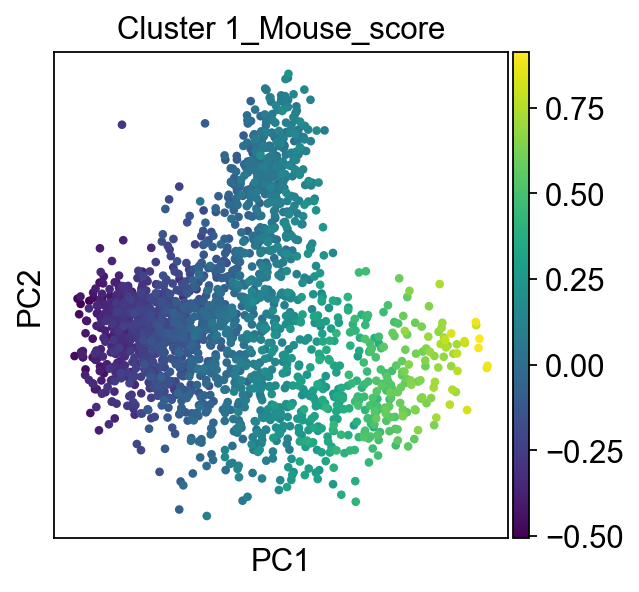

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 2_Mouse_score'
    finished: added
    'Cluster 2_Mouse_score', score of gene set (adata.obs).
    1122 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


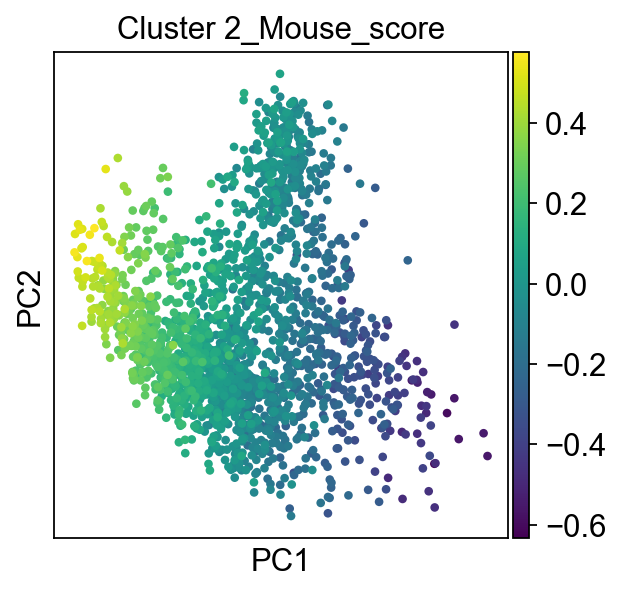

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 3_Mouse_score'
    finished: added
    'Cluster 3_Mouse_score', score of gene set (adata.obs).
    1165 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


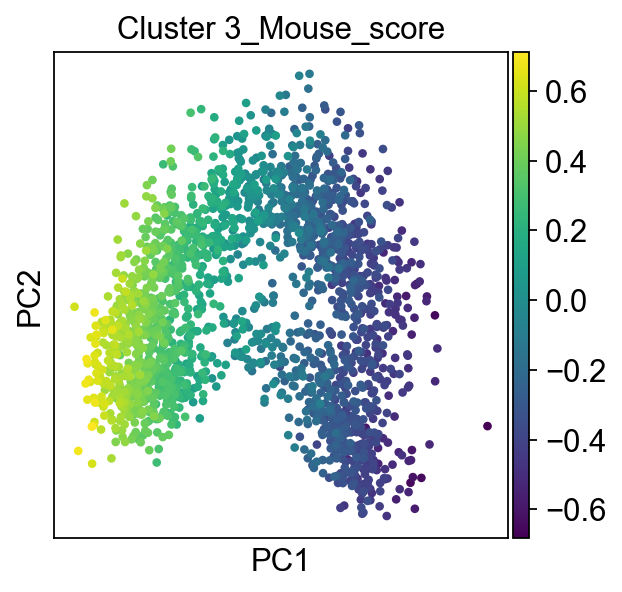

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 4_Mouse_score'
    finished: added
    'Cluster 4_Mouse_score', score of gene set (adata.obs).
    1177 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


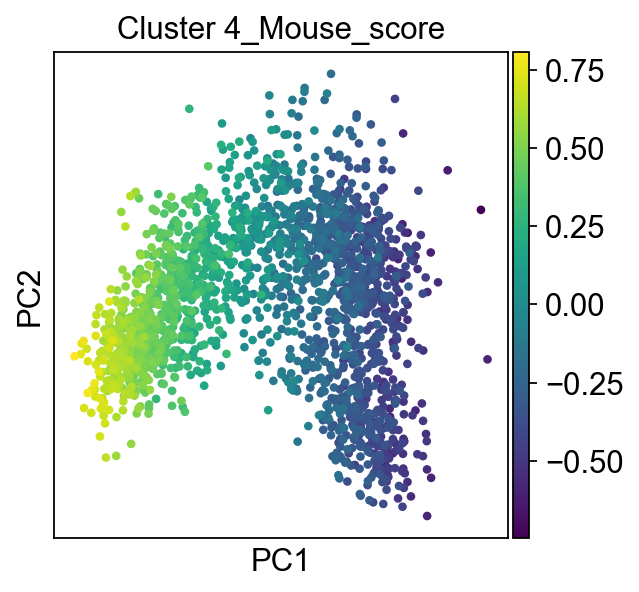

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 5_Mouse_score'
    finished: added
    'Cluster 5_Mouse_score', score of gene set (adata.obs).
    1174 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


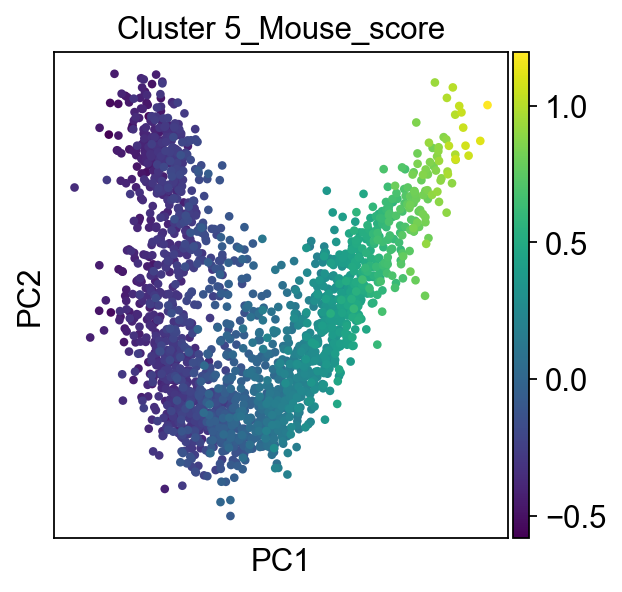


slide2_small\spm.h5ad

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 1_Mouse_score'
    finished: added
    'Cluster 1_Mouse_score', score of gene set (adata.obs).
    1164 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


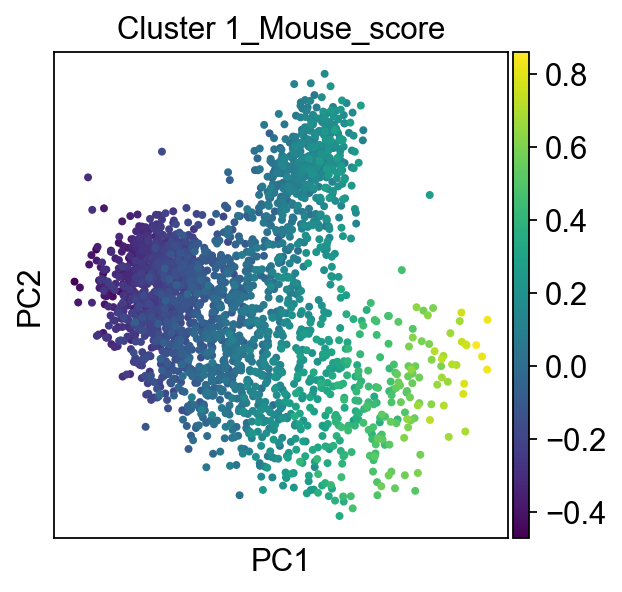

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 2_Mouse_score'
    finished: added
    'Cluster 2_Mouse_score', score of gene set (adata.obs).
    1164 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


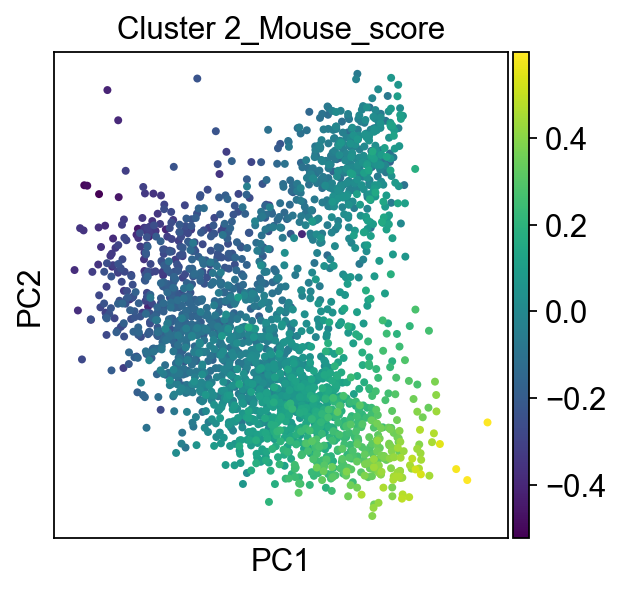

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 3_Mouse_score'
    finished: added
    'Cluster 3_Mouse_score', score of gene set (adata.obs).
    1160 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


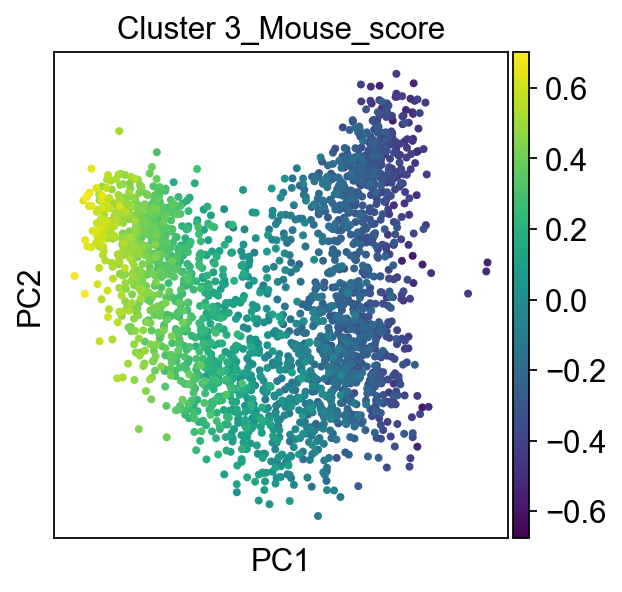

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 4_Mouse_score'
    finished: added
    'Cluster 4_Mouse_score', score of gene set (adata.obs).
    1132 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


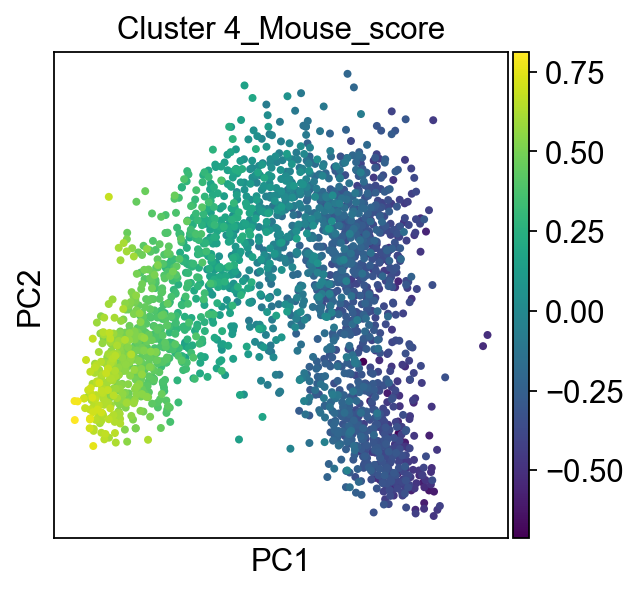

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'Cluster 5_Mouse_score'
    finished: added
    'Cluster 5_Mouse_score', score of gene set (adata.obs).
    1177 total control genes are used. (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


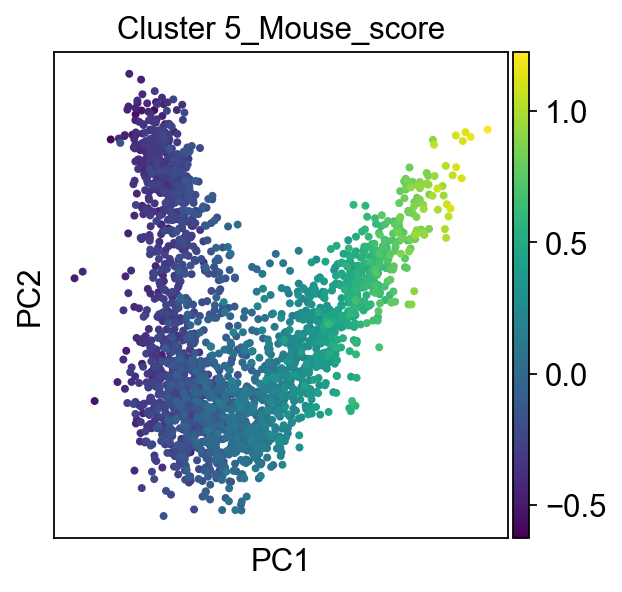

In [6]:
file_names  = ['slide1_small\\spm.h5ad','slide2_small\\spm.h5ad'] 

mainpath = r'C:\\Users\\TzachiHNB5\\Documents\\Project_barrier_immune\\scanpy\\gut_analysis\\mouse_Spatial\\'
bdatas = []
mouse_score = pd.read_csv("zonation_score_genes.csv",index_col=0)
columns_to_select = [col for col in mouse_score.columns if col.endswith('_Mouse')]
mouse_score = mouse_score[columns_to_select]
mouse_score.fillna('null',inplace=True)
cluster_dict = {}
for group in mouse_score.columns:
    cluster_dict[group] = [i for i in mouse_score[group].values if i!='null']

for file in file_names:
    bdata=sc.read(mainpath+file) 
    print('\n'+file +'\n')
    for group in cluster_dict:
        DE_score(bdata,cluster_dict[group],group)          

    bdatas.append(bdata)

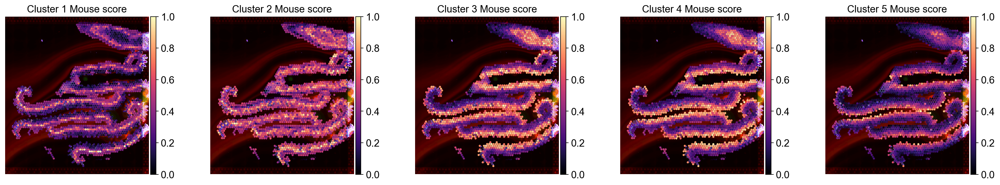

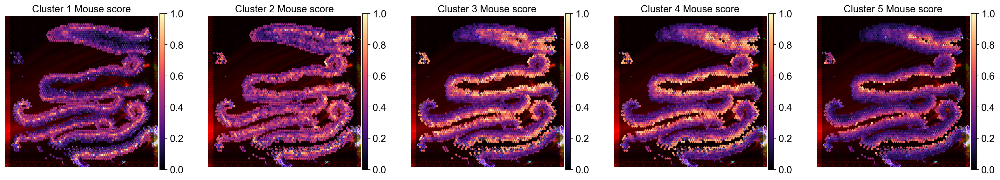

In [7]:
names  = ['slide1_small','slide2_small']
scores = ['Cluster 1_Mouse_score','Cluster 2_Mouse_score','Cluster 3_Mouse_score','Cluster 4_Mouse_score','Cluster 5_Mouse_score']
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
for i in range(0,len(bdatas)):
    for col in scores:
        x = bdatas[i].obs[col].copy()
        bdatas[i].obs[col] = (x-np.min(x))/(np.max(x)-np.min(x))

for data,name in zip(bdatas,names):
    
    sc.pl.spatial(data, img_key="hires",ncols=5, color=scores, size=1.5,color_map = 'magma',frameon=False,title = [i.replace('_',' ') for i in scores],save = '_'+name+'__mouse_villi_scores.pdf')
    